<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/nyandwi/machine_learning_complete/blob/main/9_nlp_with_tensorflow/2_using_word_embeddings_to_represent_texts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
</table>

*This notebook was created by [Jean de Dieu Nyandwi](https://twitter.com/jeande_d) for the love of machine learning community. For any feedback, errors or suggestion, he can be reached on email (johnjw7084 at gmail dot com), [Twitter](https://twitter.com/jeande_d), or [LinkedIn](https://linkedin.com/in/nyandwi).*

<a name='0'></a>
# Using Word Embeddings to Represent Texts

## Contents 

* [1. Intro Word Embeddings](#1)
* [2. Embedding In Practice](#2)
   * [2.1 Getting the data](#2-1)
   * [2.2 Preparing the data](#2-2)
   * [2.3 Building, compiling and training a sentiment analysis model](#2-3)
   * [2.4 Visualizing the model results](#2-4)
   * [2.5 Testing the model on new reviews](#2-5)

<a name='1'></a>
## 1. Intro to Word Embeddings

Word Embeddings are used to represent the words in the form of a feature vectors. The words with similar meaning will have the same representations. 

Embeddings are trainable and that means that during the model training, they will improve. The similar words will end up having the same representation. 

In vector speaking, similar words will have the same direction. 

There is this [Embedding Projector](http://projector.tensorflow.org) that let you visualize and play with embeddings. Have a tour there and search some words. 

For example, searching programming, you will see words similar in meaning to programming in the same vector space. 

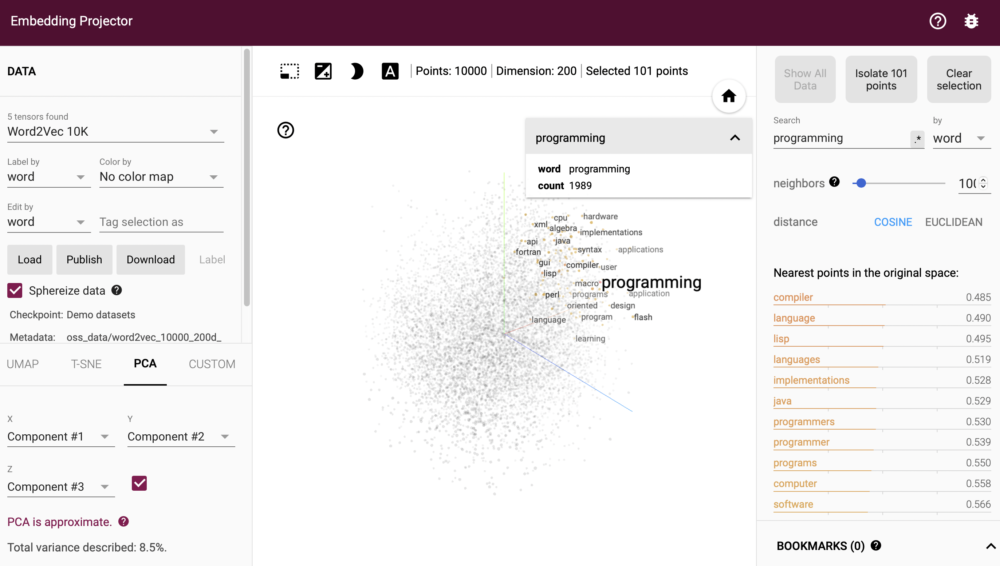

Keras has an embedding layer. We will use it in later practice, but feel free to learn more in [documentation](https://keras.io/api/layers/core_layers/embedding/). 

<a name='2'></a>

## 2. Embeddings In Practice

We are going to practice embeddings on Imdb reviews. Imdb reviews is the hello world of natural language processing, just like mnist is for computer vision.

We will be building a sentiment analysis - classifying the movie reviews.

<a name='2-1'></a>
### 2.1. Getting the Imdb Reviews Data

Imdb reviews contains positive and negative movies reviews. You can learn more about this dataset [here](https://ai.stanford.edu/~amaas/data/sentiment/).

```
@InProceedings{maas-EtAl:2011:ACL-HLT2011,
  author    = {Maas, Andrew L.  and  Daly, Raymond E.  and  Pham, Peter T.  and  Huang, Dan  and  Ng, Andrew Y.  and  Potts, Christopher},
  title     = {Learning Word Vectors for Sentiment Analysis},
  booktitle = {Proceedings of the 49th Annual Meeting of the Association for Computational Linguistics: Human Language Technologies},
  month     = {June},
  year      = {2011},
  address   = {Portland, Oregon, USA},
  publisher = {Association for Computational Linguistics},
  pages     = {142--150},
  url       = {http://www.aclweb.org/anthology/P11-1015}
}
```

We will get the data from [Keras datasets built in datasets](https://keras.io/api/datasets/imdb/). It is also available in [TensorFlow datasets](https://www.tensorflow.org/datasets/catalog/imdb_reviews).

#### Imports

In [112]:
import tensorflow as tf
from tensorflow import keras
import numpy as np

Loading the training and validation data from Keras datasets. There are 25.000 samples for training and 25.000 samples for validation. 

Also, setting `max_features` to 20000 means we are only considering the first 20000 words, and `sequence_length` of 200 denotes that we will take the first 200 words in each movie review.

In [113]:
max_features = 20000
sequence_length = 200

(train_data, train_labels), (val_data, val_labels) = keras.datasets.imdb.load_data(num_words=max_features)

In [114]:
train_data[:2]

array([list([1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 19193, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 10311, 8, 4, 107, 117, 5952, 15, 256, 4, 2, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 12118, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 5535, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 1334, 88, 12, 16, 283, 5, 16, 4472, 113, 103, 32, 15, 16, 5345, 19, 178, 32]),
       list([1, 194, 1153, 194, 82

In [115]:
train_labels[:10]

array([1, 0, 0, 1, 0, 0, 1, 0, 1, 0])

<a name='2-2'></a>

### 2.2. Preparing the Dataset

The Imbd dataset that we loaded from Keras was already converted to tokens, so we won't have to do much work here. 

We are going to only convert the tokens into sequences. 

In [116]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

train_data = pad_sequences(train_data, maxlen=sequence_length)
val_data = pad_sequences(val_data, maxlen=sequence_length)



<a name='2-3'></a>

### 2.3. Build, Compile and Train the Model

The purpose of this lab is to learn embeddings. The Keras Embedding layer will take the tokens and represent them into a high dimensional vector, where the vector of the words that has the same semantic meaning will have the same direction. 

In essence, embedding layer will take the number of the words in a vocabulary and the number of dimensions

In [117]:
# embedding layer: represent 100 words into 5 dimensions

embedding_layer = tf.keras.layers.Embedding(100,5)

embed_integers = embedding_layer(tf.constant([1,2,3,4]))

embed_integers.numpy()

array([[ 1.2614403e-02, -1.1478484e-02,  8.1606880e-03, -3.9430130e-02,
         2.0547520e-02],
       [-8.9646950e-03, -1.1008494e-03, -3.3753276e-02, -3.0158116e-02,
         4.5642104e-02],
       [ 5.8295615e-03,  2.1967243e-02,  2.9412154e-02,  1.9587997e-02,
        -4.6676543e-02],
       [ 2.0423044e-02, -2.1431793e-02,  2.7912881e-02,  1.5731920e-02,
         3.9350241e-05]], dtype=float32)

The above is what the embedding layer will exactly do: representing words into feature vector of a given dimension. 

Embeddings are trainable, and that means as we train the model, words that are similar will get closer and closer. You can have a taste of this notion by visiting [Embedding Projector](http://projector.tensorflow.org).

In [118]:
# Create a model

embedding_dim = 16

model = tf.keras.Sequential([
       tf.keras.layers.Embedding(max_features, embedding_dim, input_length=sequence_length),
       tf.keras.layers.GlobalAveragePooling1D(),
       tf.keras.layers.Dense(6, activation='relu'),
       tf.keras.layers.Dropout(0.5),
       tf.keras.layers.Dense(1, activation='sigmoid')
])

We will use Tensorboard to visualize training metrics and embeddings.

In [119]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs")

We will compile the model with the loss of `binary_crossentropy` and `adam` optimizer.

In [120]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

Before training the model, we can see the model summary.

In [121]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_11 (Embedding)     (None, 200, 16)           320000    
_________________________________________________________________
global_average_pooling1d_6 ( (None, 16)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 6)                 102       
_________________________________________________________________
dropout_5 (Dropout)          (None, 6)                 0         
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 7         
Total params: 320,109
Trainable params: 320,109
Non-trainable params: 0
_________________________________________________________________


In [122]:
history = model.fit(train_data, 
                    train_labels,
                    validation_data = (val_data, val_labels),
                    epochs = 5,
                    callbacks=[tensorboard_callback])

Epoch 1/5
782/782 [==============================] - 7s 8ms/step - loss: 0.6281 - accuracy: 0.6886 - val_loss: 0.5163 - val_accuracy: 0.8107
Epoch 2/5
782/782 [==============================] - 6s 8ms/step - loss: 0.4767 - accuracy: 0.8266 - val_loss: 0.4096 - val_accuracy: 0.8722
Epoch 3/5
782/782 [==============================] - 6s 8ms/step - loss: 0.4086 - accuracy: 0.8503 - val_loss: 0.3566 - val_accuracy: 0.8772
Epoch 4/5
782/782 [==============================] - 6s 8ms/step - loss: 0.3586 - accuracy: 0.8715 - val_loss: 0.3412 - val_accuracy: 0.8788
Epoch 5/5
782/782 [==============================] - 6s 8ms/step - loss: 0.3293 - accuracy: 0.8836 - val_loss: 0.3413 - val_accuracy: 0.8772


<a name='2-4'></a>

### 2.4. Visualizing the Model Results

As we have provided TensorBoard callback during the model training, we can visualize the model results and embeddings. 

In [123]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1526), started 0:51:24 ago. (Use '!kill 1526' to kill it.)

<IPython.core.display.Javascript object>

TensorBoard is a fantastic model visualization tool. If you are running this, spend sometime looking over the graphs in TensorBoard. 

<a name='2-5'></a>

### 2.5. Testing the Model on New texts

Let's test the sentiment classifier on some sample reviews.

In [126]:
negative_review = ["This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. This must simply be their worst role in history"]

# Convert the test sentence to tokens and sequences

from tensorflow.keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(num_words=20000)
tokenizer.fit_on_texts(negative_review)

neg_sequences = tokenizer.texts_to_sequences(negative_review)

# Pad the sequence to have the size of the sequences used for model training

neg_sequences  = pad_sequences(neg_sequences  , maxlen = sequence_length)


# Predict the review
model.predict(neg_sequences)

array([[0.54507416]], dtype=float32)

In [127]:
positive_review = ["Very beautiful and awesome movie. This is the kind of film for a snowy Sunday afternoon when the rest of the world can go ahead with its own business as you descend into a big arm-chair and mellow for a couple of hours. "]

# Convert the test sentence to tokens 
tokenizer_2 = Tokenizer(num_words=20000)
tokenizer_2.fit_on_texts(positive_review)

pos_sequences = tokenizer_2.texts_to_sequences(positive_review)
pos_sequences = pad_sequences(pos_sequences, maxlen = sequence_length)

model.predict(pos_sequences)

array([[0.4356643]], dtype=float32)

This is it about word embeddings. Embeddings alone are not enough. In the next notebook, we will introduce Recurrent Neural Networks(RNNs) and Long Short Term Memories(LSTMs). RNNs and LSTMs are some of the fundamental language models that are widely used to day.

[BACK TO TOP](#0)